In [2]:
"""
Notebook con analisis de presencia de caos y otros indicadores para datos SARS-CoV-II
de diferentes paises y ciudades
"""

'\nNotebook con analisis de presencia de caos y otros indicadores para datos SARS-CoV-II\nde diferentes paises y ciudades\n'

# Análisis de Series de Tiempo SARS-CoV-II para NY, LA, FR, CO

## Obtenemos cifras de casos en los condados de US por [https://github.com/nytimes/covid-19-data]
## Por otra parte, las cifras a nivel nacional se obtienen de [https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_time_series]

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import statsmodels.api as sm
from matplotlib import animation

sns.set()


from nolitsa import data, dimension, delay, noise, lyapunov
from mpl_toolkits.mplot3d import Axes3D
from statsmodels.tsa.filters.hp_filter import hpfilter

from sklearn.metrics import mutual_info_score
from scipy.stats import chi2_contingency

## Datos Paises

In [112]:
data_casos_mundo = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\time_series_covid19_confirmed_global.csv')#, parse_dates=['Region'], index_col='Region')

data_muertes_mundo = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\time_series_covid19_deaths_global.csv')#, parse_dates=['Region'], index_col='Region')

data_US_counties = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\us-counties.csv')#, parse_dates=['Region'], index_col='Region')


In [113]:
data_ES_cases = data_casos_mundo[data_casos_mundo['Country/Region'] == 'Spain']
data_ES_deaths = data_muertes_mundo[data_muertes_mundo['Country/Region'] == 'Spain']

data_FR_cases = data_casos_mundo[data_casos_mundo['Country/Region'] == 'France']
data_FR_deaths = data_muertes_mundo[data_muertes_mundo['Country/Region'] == 'France']

data_CO_cases = data_casos_mundo[data_casos_mundo['Country/Region'] == 'Colombia']
data_CO_deaths = data_muertes_mundo[data_muertes_mundo['Country/Region'] == 'Colombia']

data_MX_cases = data_casos_mundo[data_casos_mundo['Country/Region'] == 'Mexico']
data_MX_deaths = data_muertes_mundo[data_muertes_mundo['Country/Region'] == 'Mexico']

In [114]:
data_ES_cases = data_ES_cases.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])
data_ES_deaths = data_ES_deaths.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])

data_FR_cases = data_FR_cases.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])
data_FR_deaths = data_FR_deaths.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])

data_FR_cases = data_FR_cases.loc[126]
data_FR_deaths = data_FR_deaths.loc[126]

data_CO_cases = data_CO_cases.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])
data_CO_deaths = data_CO_deaths.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])

data_MX_cases = data_MX_cases.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])
data_MX_deaths = data_MX_deaths.drop(columns=['Province/State', 'Country/Region', 'Lat', 'Long'])

In [115]:
ES_cases = np.diff(np.array(data_ES_cases)[0])
ES_deaths = np.diff(np.array(data_ES_deaths)[0])

FR_cases = np.diff(np.array(data_FR_cases))
FR_deaths = np.diff(np.array(data_FR_deaths))

CO_cases = np.diff(np.array(data_CO_cases)[0])
CO_deaths = np.diff(np.array(data_CO_deaths)[0])

MX_cases = np.diff(np.array(data_MX_cases)[0])
MX_deaths = np.diff(np.array(data_MX_deaths)[0])

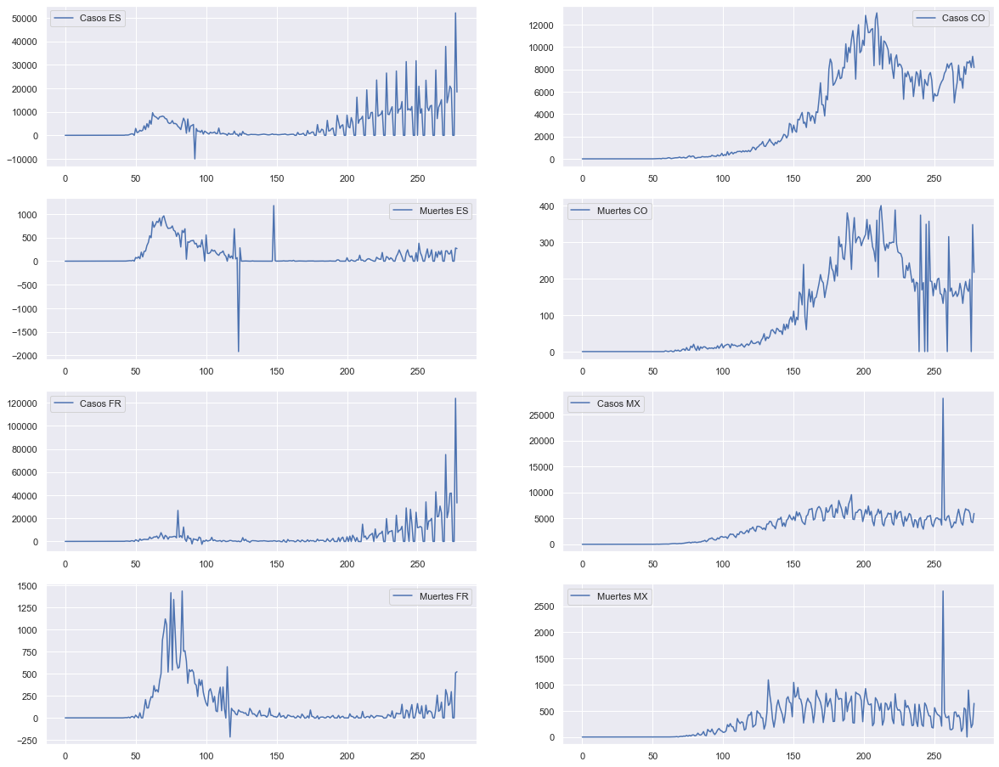

In [10]:
fig, axs = plt.subplots(4, 2, figsize=(20, 16))

axs[0, 0].plot(ES_cases, label='Casos ES')
axs[0, 0].legend()
axs[1, 0].plot(ES_deaths, label='Muertes ES')
axs[1, 0].legend()

axs[2, 0].plot(FR_cases, label='Casos FR')
axs[2, 0].legend()
axs[3, 0].plot(FR_deaths, label='Muertes FR')
axs[3, 0].legend()

axs[0, 1].plot(CO_cases, label='Casos CO')
axs[0, 1].legend()
axs[1, 1].plot(CO_deaths, label='Muertes CO')
axs[1, 1].legend()

axs[2, 1].plot(MX_cases, label='Casos MX')
axs[2, 1].legend()
axs[3, 1].plot(MX_deaths, label='Muertes MX')
axs[3, 1].legend()


## Datos Ciudades de US

In [105]:
data_US_counties = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\us-counties.csv', parse_dates=['date'], index_col='date')

# data_US_counties

In [37]:
data_NY = data_US_counties[data_US_counties['county'] == 'New York City'].drop(columns=['county', 'fips', 'state'])
data_LA = data_US_counties[data_US_counties['county'] == 'Los Angeles'].drop(columns=['county', 'fips', 'state'])

NY_cases = data_NY['cases'].diff().iloc[1:]
NY_deaths = data_NY['deaths'].diff().iloc[1:]

LA_cases = data_LA['cases'].diff().iloc[1:]
LA_deaths = data_LA['deaths'].diff().iloc[1:]

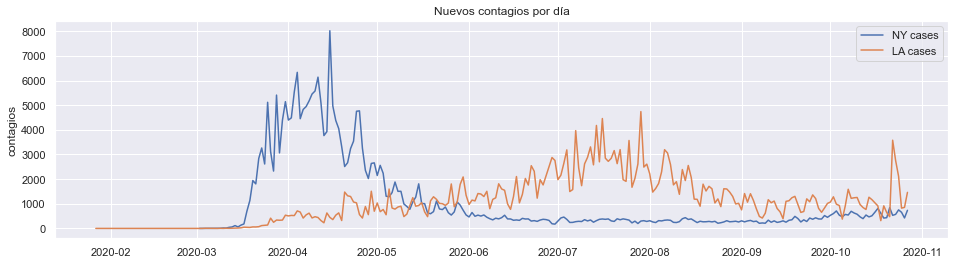

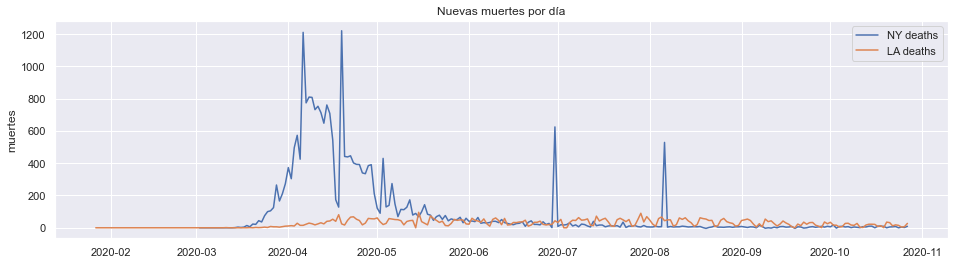

In [38]:
plt.figure(0, figsize=(16,4))
plt.clf()
plt.plot(NY_cases, label='NY cases')
plt.plot(LA_cases, label='LA cases')
plt.title('Nuevos contagios por día')
plt.ylabel('contagios')
plt.legend()
plt.show()

plt.figure(1, figsize=(16,4))
plt.clf()
plt.plot(NY_deaths, label='NY deaths')
plt.plot(LA_deaths, label='LA deaths')
plt.title('Nuevas muertes por día')
plt.ylabel('muertes')
plt.legend()
plt.show()

# Análisis Series de Tiempo NY, LA

In [39]:
# Normalizamos las Series como en el paper de Canals

NY_cases = NY_cases / np.max(NY_cases)
NY_deaths = NY_deaths / np.max(NY_deaths)

LA_cases = LA_cases / np.max(LA_cases)
LA_deaths = LA_deaths / np.max(LA_deaths)

### Obtenemos el Promedio de Informacion Mutua (AMI) mediante R


#### Primero pasamos los datos a csv para leerlos en R

In [40]:
# np.savetxt('NY_cases', NY_cases, delimiter=',')
# np.savetxt('LA_cases', LA_cases, delimiter=',')

# np.savetxt('NY_deaths', NY_deaths, delimiter=',')
# np.savetxt('LA_deaths', LA_deaths, delimiter=',')

In [42]:
AMI_NY_LA = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\AMI_NY_LA.csv')
AMI_NY_LA.head()

,mutual_NY_cases,mutual_LA_cases,mutual_NY_deaths,mutual_LA_deaths
0,1.543574,2.270372,1.060273,2.348389
1,0.918496,1.002376,0.643627,0.687532
2,0.901331,0.928649,0.620069,0.603016
3,0.837605,0.887055,0.628029,0.554814
4,0.775847,0.858323,0.582515,0.570901


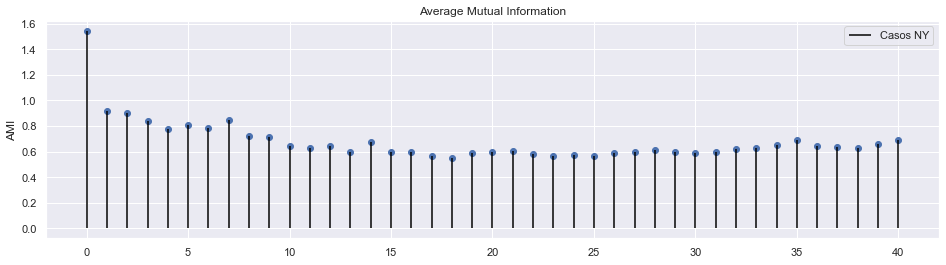

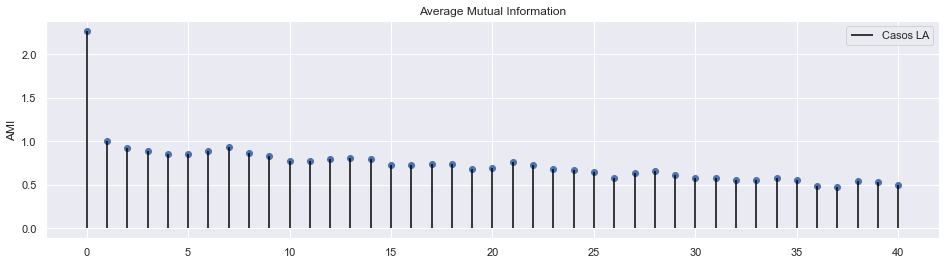

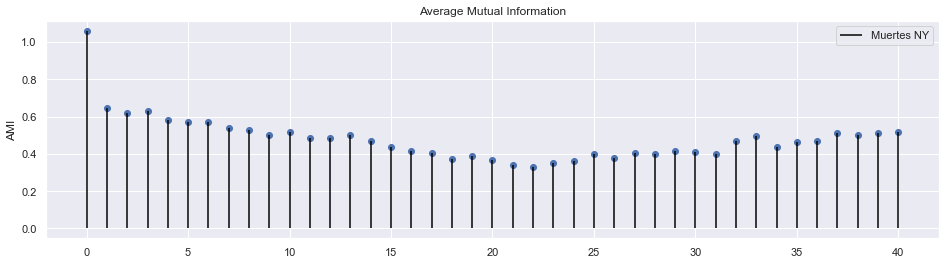

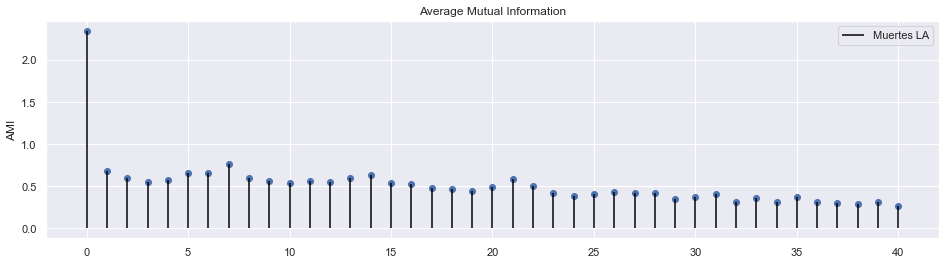

In [43]:
AMI_NY_cases = np.array(AMI_NY_LA['mutual_NY_cases'])
AMI_LA_cases = np.array(AMI_NY_LA['mutual_LA_cases'])

AMI_NY_deaths = np.array(AMI_NY_LA['mutual_NY_deaths'])
AMI_LA_deaths = np.array(AMI_NY_LA['mutual_LA_deaths'])

plt.figure(2, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_NY_cases, label='Casos NY', color='black')
plt.scatter(np.arange(41), AMI_NY_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_LA_cases, label='Casos LA', color='black')
plt.scatter(np.arange(41), AMI_LA_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_NY_deaths, label='Muertes NY', color='black')
plt.scatter(np.arange(41), AMI_NY_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_LA_deaths, label='Muertes LA', color='black')
plt.scatter(np.arange(41), AMI_LA_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

In [44]:
delay_NY_cases = []
delay_LA_cases = []

delay_NY_deaths = []
delay_LA_deaths = []

for i in range(len(AMI_NY_cases)-2):
    if AMI_NY_cases[i] > AMI_NY_cases[i+1] and AMI_NY_cases[i+2] > AMI_NY_cases[i+1]:
        delay_NY_cases.append(i+1)

for i in range(len(AMI_LA_cases)-2):
    if AMI_LA_cases[i] > AMI_LA_cases[i+1] and AMI_LA_cases[i+2] > AMI_LA_cases[i+1]:
        delay_LA_cases.append(i+1)

for i in range(len(AMI_NY_deaths)-2):
    if AMI_NY_deaths[i] > AMI_NY_deaths[i+1] and AMI_NY_deaths[i+2] > AMI_NY_deaths[i+1]:
        delay_NY_deaths.append(i+1)

for i in range(len(AMI_LA_deaths)-2):
    if AMI_LA_deaths[i] > AMI_LA_deaths[i+1] and AMI_LA_deaths[i+2] > AMI_LA_deaths[i+1]:
        delay_LA_deaths.append(i+1)

print('Tiempos de Retardo para NY casos:', delay_NY_cases)
print('Tiempos de Retardo para LA casos:', delay_LA_cases)
print('Tiempos de Retardo para NY muertes:', delay_NY_deaths)
print('Tiempos de Retardo para LA muertes:', delay_LA_deaths)

Tiempos de Retardo para NY casos: [4, 6, 11, 13, 18, 23, 25, 30, 38]
Tiempos de Retardo para LA casos: [5, 10, 16, 19, 26, 32, 37]
Tiempos de Retardo para NY muertes: [2, 9, 12, 18, 22, 26, 28, 31, 34, 38]
Tiempos de Retardo para LA muertes: [3, 10, 12, 19, 24, 27, 29, 32, 34, 38]


### Calculamos la dimension de inmersion con FNN mediante el paquete $\texttt{nolitsa}$ en Python, el cual ocupa el método descrito en Kennel et al. (1992)

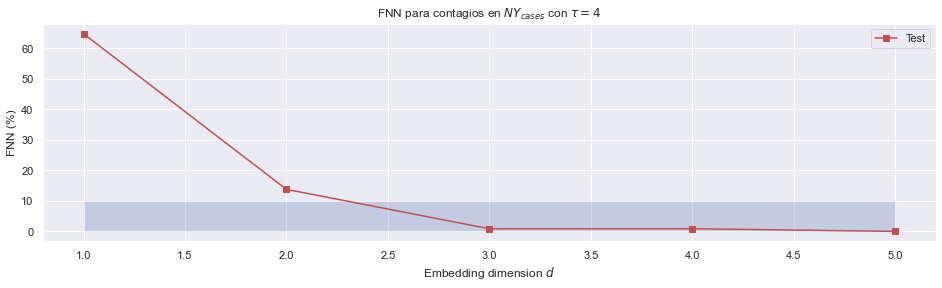

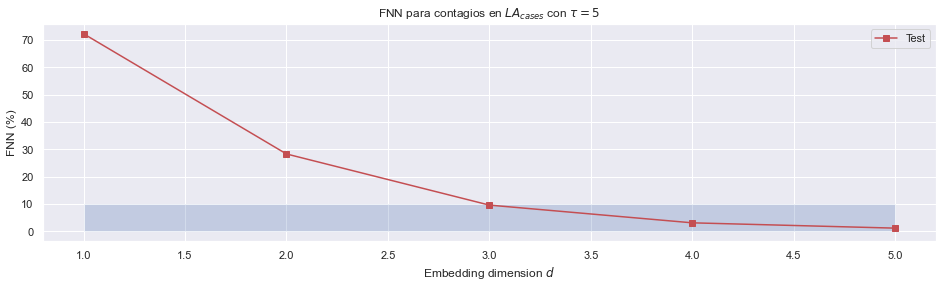

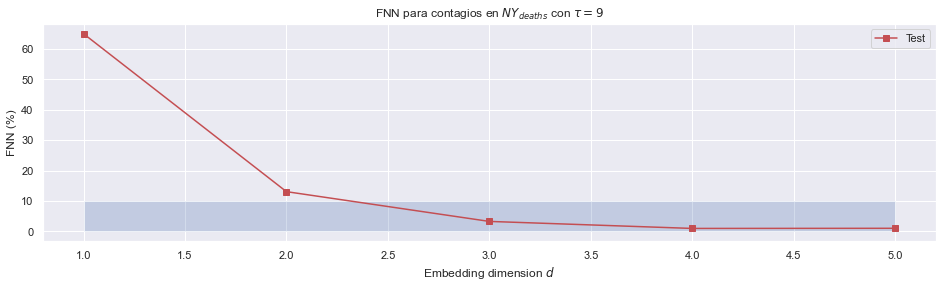

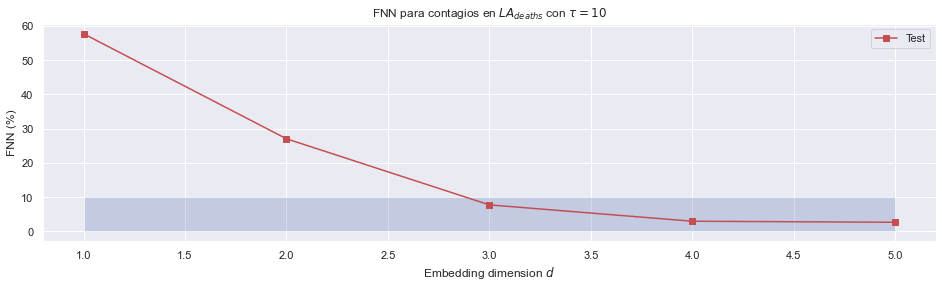

In [51]:
dim = np.arange(1, 6)
f1, f2, f3 = dimension.fnn(NY_cases, tau=4, dim=dim, window=25) #, metric='chebyshev')

plt.figure(4, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $NY_{cases}$ con $\\tau=4$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(LA_cases, tau=5, dim=dim, window=12, maxnum=100) #, metric='chebyshev')

plt.figure(4, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $LA_{cases}$ con $\\tau=5$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(NY_deaths, tau=9, dim=dim, window=18) #, metric='chebyshev')

plt.figure(5, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $NY_{deaths}$ con $\\tau=9$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(LA_deaths, tau=10, dim=dim, window=12, maxnum=100) #, metric='chebyshev')

plt.figure(5, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $LA_{deaths}$ con $\\tau=10$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

## Reconstruimos el atractor

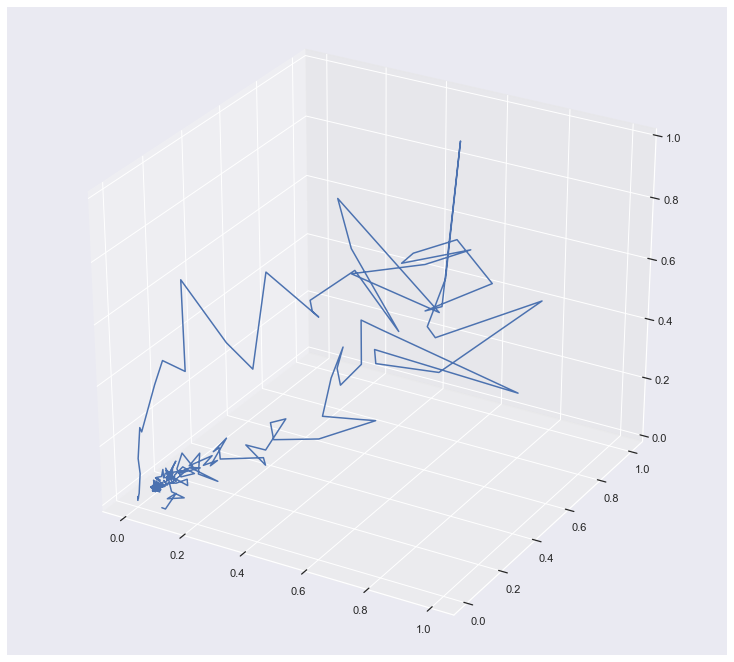

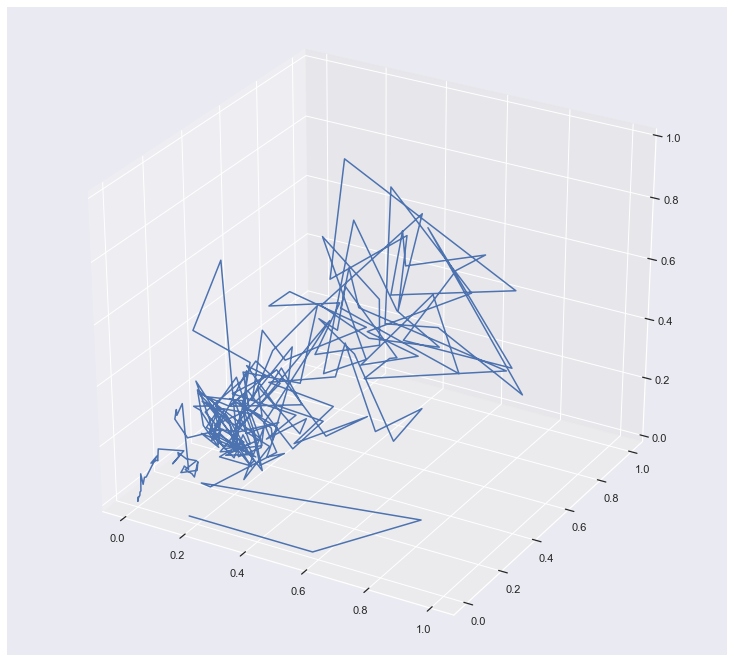

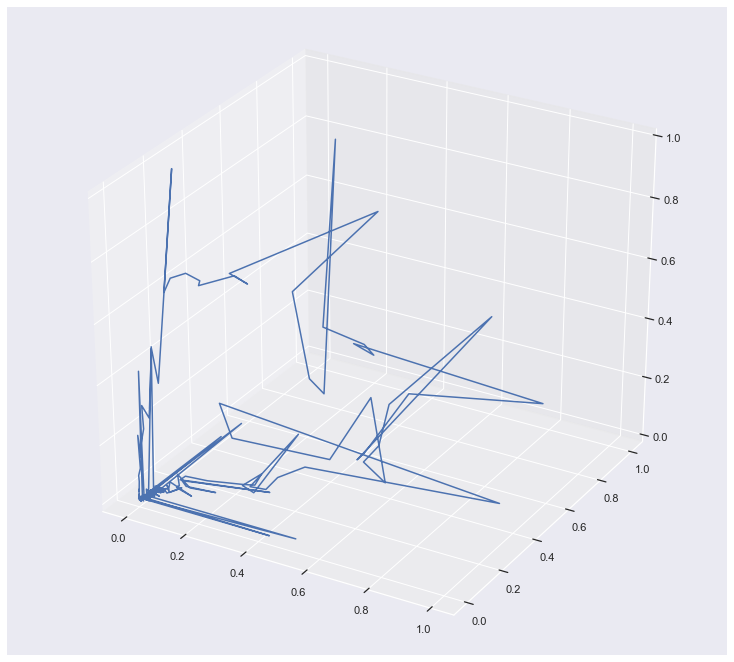

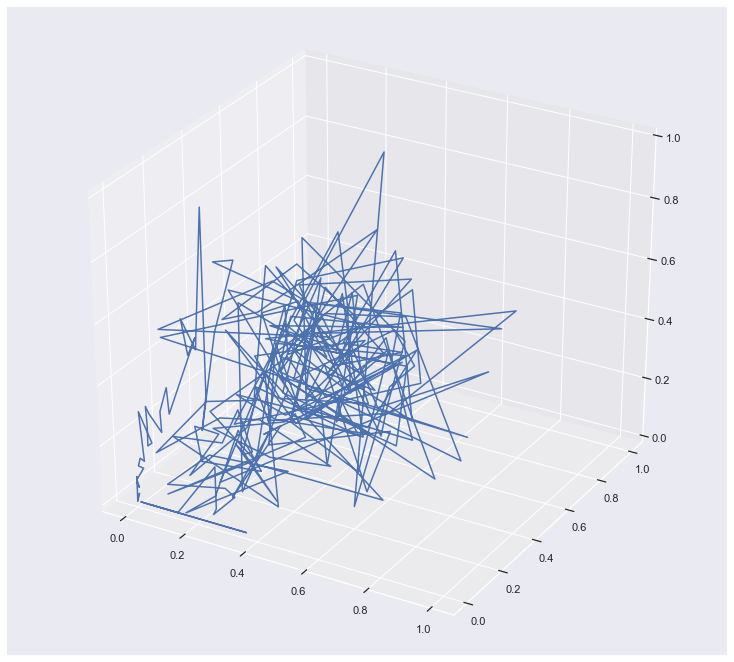

In [52]:
tau_NY_cases = 4

figg = plt.figure(6, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(NY_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(NY_cases), -tau_NY_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(NY_cases), -2 * tau_NY_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_LA_cases = 5

figg = plt.figure(6, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(LA_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(LA_cases), -tau_LA_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(LA_cases), -2 * tau_LA_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_NY_deaths = 9

figg = plt.figure(7, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(NY_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(NY_deaths), -tau_NY_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(NY_deaths), -2 * tau_NY_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_LA_deaths = 10

figg = plt.figure(7, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(LA_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(LA_deaths), -tau_LA_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(LA_deaths), -2 * tau_LA_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

# ORDEN:
# - NY_cases
# - LA_cases
# - NY_deaths
# - LA_deaths

In [69]:
len(LA_deaths)

275

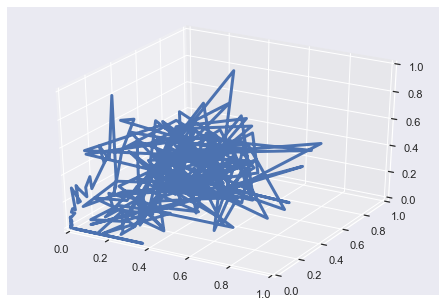

In [118]:
fig = plt.figure(16)
plt.clf()
axes = Axes3D(fig, xlim=(0, 1), ylim=(0, 1), zlim=(0, 1))

line, = axes.plot([], [], [], lw=3)

def init():
    line.set_data([], [], [])
    return line, 

def animate(i):
    X = np.array(LA_deaths)[:-2].flatten()[:i]
    Y = np.roll(np.array(LA_deaths), -tau_LA_deaths)[:-2].flatten()[:i]
    Z = np.roll(np.array(LA_deaths), -2 * tau_LA_deaths)[:-2].flatten()[:i]
    line.set_data(X, Y)
    line.set_3d_properties(Z)
    return line,

anim = animation.FuncAnimation(fig, animate, # init_func=init,
                               frames=274, interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_jshtml())

### Calculemos el Maximo Coeficiente del Exponente de Lyapunov (MCLE) mediante $\texttt{tseriesChaos}$

- series: time series.
- m: embedding dimension.
- d: time delay.
- t: Theiler window. Points separated by less than t in the series series are excluded from the search for neighbouring points.
- k: number of neighbours considered.
- ref: number of points in series taken into account.
- s: iterations along which the neighbours of each point are followed.
- eps: radius of the ball inside which nearest neighbours are searched for.

In [59]:
S_nu_NY_LA = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\S_nu_NY_LA.csv')
S_nu_NY_LA.head()

,S_nu_NY_cases,S_nu_LA_cases,S_nu_NY_deaths,S_nu_LA_deaths
0,-4.016256,-inf,-4.185477,-inf
1,-3.449491,-inf,-2.844105,-inf
2,-3.423970,-inf,-2.883923,-inf
3,-3.409127,-inf,-3.075467,-inf
4,-3.654246,-inf,-2.905830,-inf


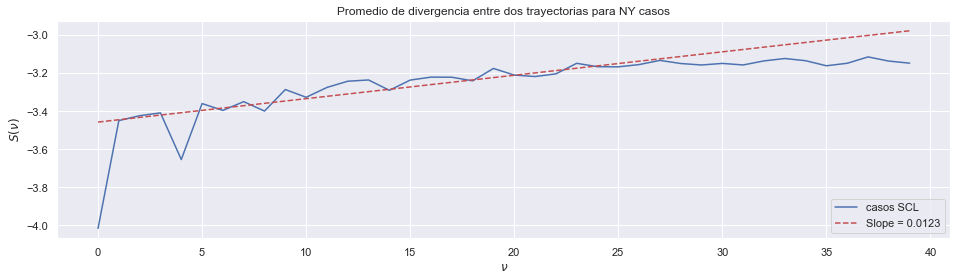

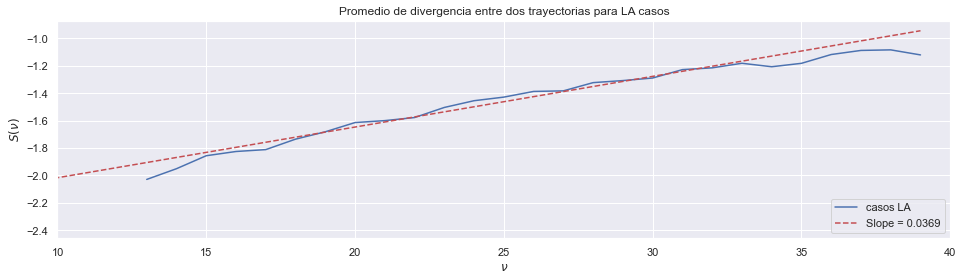

In [65]:
S_nu_NY_cases = S_nu_NY_LA['S_nu_NY_cases']
S_nu_LA_cases = S_nu_NY_LA['S_nu_LA_cases']
S_nu_NY_deaths = S_nu_NY_LA['S_nu_NY_deaths']
S_nu_LA_deaths = S_nu_NY_LA['S_nu_LA_deaths']

nu = np.arange(len(S_nu_NY_cases))

MCLE_NY_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[3:30], S_nu_NY_cases[3:30])

plt.figure(8, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_NY_cases, label='casos NY')
plt.plot(nu, MCLE_NY_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_NY_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para NY casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

nu = np.arange(len(S_nu_LA_cases))

MCLE_LA_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[15:35], S_nu_LA_cases[15:35])

plt.figure(9, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_LA_cases, label='casos LA')
plt.plot(nu, MCLE_LA_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_LA_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para LA casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.xlim(10, 40)
plt.legend(loc=4)
plt.show()



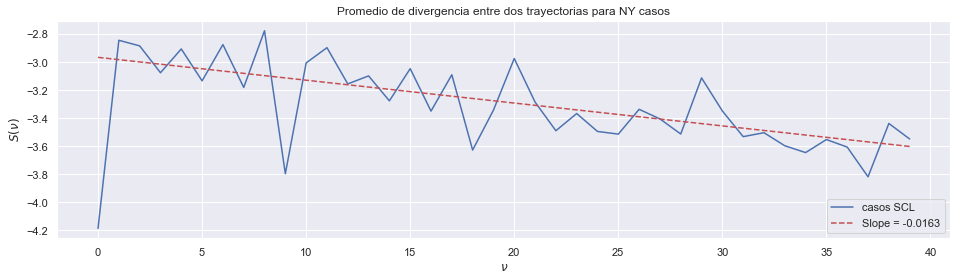

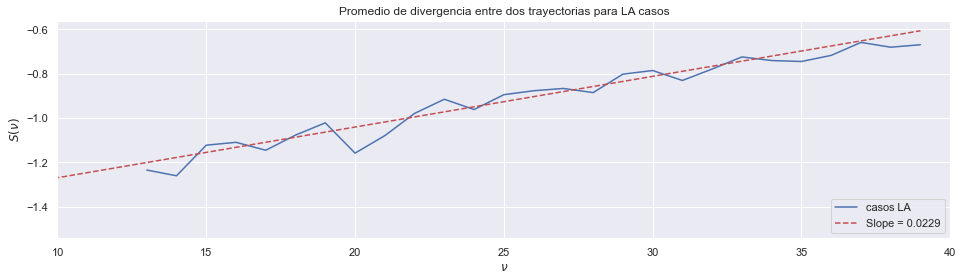

In [66]:
nu = np.arange(len(S_nu_NY_deaths))

MCLE_NY_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[3:30], S_nu_NY_deaths[3:30])

plt.figure(8, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_NY_deaths, label='muertes NY')
plt.plot(nu, MCLE_NY_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_NY_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para NY muertes')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.show()

nu = np.arange(len(S_nu_LA_deaths))

MCLE_LA_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[15:35], S_nu_LA_deaths[15:35])

plt.figure(9, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_LA_deaths, label='muertes LA')
plt.plot(nu, MCLE_LA_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_LA_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para LA muertes')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.xlim(10, 40)
plt.legend(loc=4)
plt.show()


In [67]:
data = {'': ['NY casos', 'LA casos', 'NY muertes', 'LA muertes'], 'MCLE': 365*np.round([MCLE_NY_cases, MCLE_LA_cases, MCLE_NY_deaths, MCLE_LA_deaths], 4),'delay': [4, 5, 9, 10]}
NN = pd.DataFrame(data)
NN

,,MCLE,delay
0,NY casos,4.4895,4
1,LA casos,13.4685,5
2,NY muertes,-5.9495,9
3,LA muertes,8.3585,10


# Analisis de Series de Tiempo Paises: CO FR

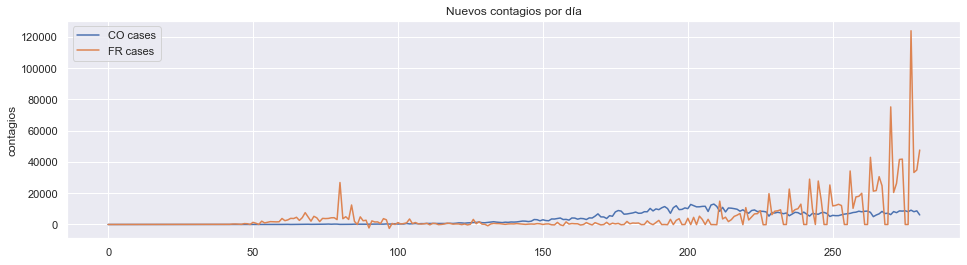

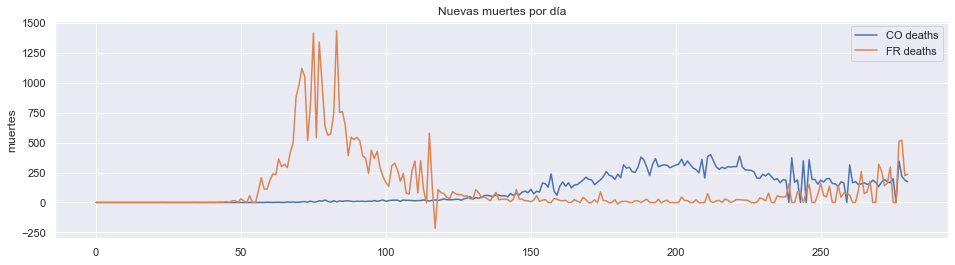

In [116]:
plt.figure(0, figsize=(16,4))
plt.clf()
plt.plot(CO_cases, label='CO cases')
plt.plot(FR_cases, label='FR cases')
plt.title('Nuevos contagios por día')
plt.ylabel('contagios')
plt.legend()
plt.show()

plt.figure(1, figsize=(16,4))
plt.clf()
plt.plot(CO_deaths, label='CO deaths')
plt.plot(FR_deaths, label='FR deaths')
plt.title('Nuevas muertes por día')
plt.ylabel('muertes')
plt.legend()
plt.show()


In [71]:
# Normalizamos las Series como en el paper de Canals

CO_cases = CO_cases / np.max(CO_cases)
CO_deaths = CO_deaths / np.max(CO_deaths)

FR_cases = FR_cases / np.max(FR_cases)
FR_deaths = FR_deaths / np.max(FR_deaths)

### Obtenemos el Promedio de Informacion Mutua (AMI) mediante R


#### Primero pasamos los datos a csv para leerlos en R


In [74]:
# np.savetxt('CO_cases', CO_cases, delimiter=',')
# np.savetxt('FR_cases', FR_cases, delimiter=',')

# np.savetxt('CO_deaths', CO_deaths, delimiter=',')
# np.savetxt('FR_deaths', FR_deaths, delimiter=',')

In [80]:
AMI_CO_FR = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\AMI_CO_FR.csv')
AMI_CO_FR.head()

,mutual_CO_cases,mutual_FR_cases,mutual_CO_deaths,mutual_FR_deaths
0,2.120584,0.693686,2.065786,1.176967
1,1.317739,0.201815,1.192956,0.543552
2,1.261870,0.062780,1.123362,0.468510
3,1.264697,0.118160,1.055406,0.515576
4,1.246795,0.127604,1.106062,0.471804


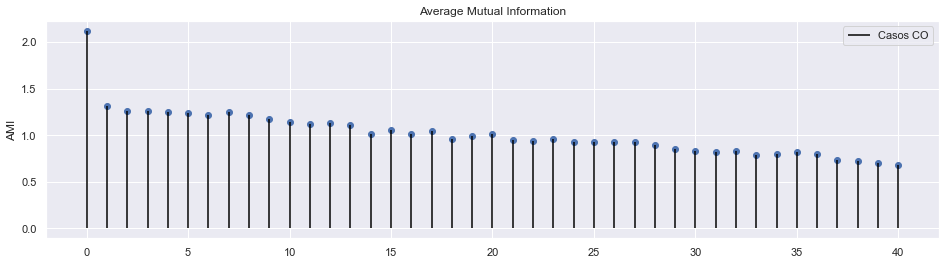

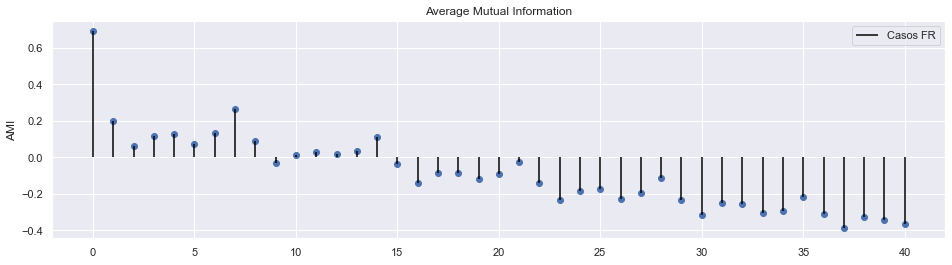

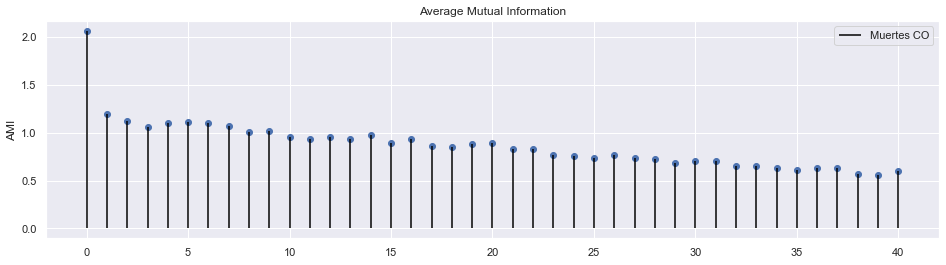

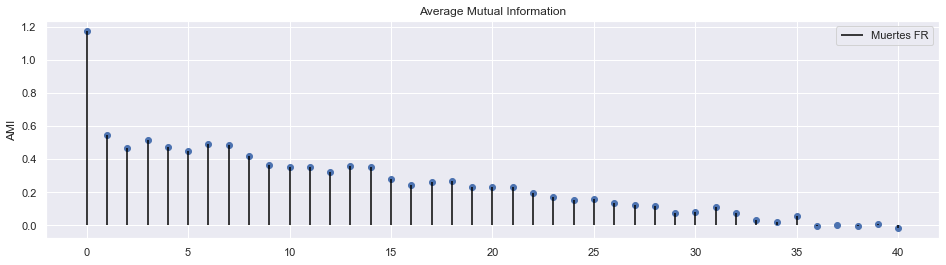

In [83]:
AMI_CO_cases = np.array(AMI_CO_FR['mutual_CO_cases'])
AMI_FR_cases = np.array(AMI_CO_FR['mutual_FR_cases'])

AMI_CO_deaths = np.array(AMI_CO_FR['mutual_CO_deaths'])
AMI_FR_deaths = np.array(AMI_CO_FR['mutual_FR_deaths'])

plt.figure(2, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_CO_cases, label='Casos CO', color='black')
plt.scatter(np.arange(41), AMI_CO_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_FR_cases, label='Casos FR', color='black')
plt.scatter(np.arange(41), AMI_FR_cases, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_CO_deaths, label='Muertes CO', color='black')
plt.scatter(np.arange(41), AMI_CO_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

plt.figure(3, figsize=(16,4))
plt.clf()

plt.vlines(np.arange(41), ymin=0, ymax=AMI_FR_deaths, label='Muertes FR', color='black')
plt.scatter(np.arange(41), AMI_FR_deaths, marker='o')

plt.legend()
plt.title('Average Mutual Information')
plt.ylabel('AMI')
plt.show()

In [84]:
delay_CO_cases = []
delay_FR_cases = []

delay_CO_deaths = []
delay_FR_deaths = []

for i in range(len(AMI_CO_cases)-2):
    if AMI_CO_cases[i] > AMI_CO_cases[i+1] and AMI_CO_cases[i+2] > AMI_CO_cases[i+1]:
        delay_CO_cases.append(i+1)

for i in range(len(AMI_FR_cases)-2):
    if AMI_FR_cases[i] > AMI_FR_cases[i+1] and AMI_FR_cases[i+2] > AMI_FR_cases[i+1]:
        delay_FR_cases.append(i+1)

for i in range(len(AMI_CO_deaths)-2):
    if AMI_CO_deaths[i] > AMI_CO_deaths[i+1] and AMI_CO_deaths[i+2] > AMI_CO_deaths[i+1]:
        delay_CO_deaths.append(i+1)

for i in range(len(AMI_FR_deaths)-2):
    if AMI_FR_deaths[i] > AMI_FR_deaths[i+1] and AMI_FR_deaths[i+2] > AMI_FR_deaths[i+1]:
        delay_FR_deaths.append(i+1)

print('Tiempos de Retardo para CO casos:', delay_CO_cases)
print('Tiempos de Retardo para FR casos:', delay_FR_cases)
print('Tiempos de Retardo para CO muertes:', delay_CO_deaths)
print('Tiempos de Retardo para FR muertes:', delay_FR_deaths)

Tiempos de Retardo para CO casos: [2, 6, 11, 14, 16, 18, 22, 26, 31, 33]
Tiempos de Retardo para FR casos: [2, 5, 9, 12, 16, 19, 23, 26, 30, 33, 37]
Tiempos de Retardo para CO muertes: [3, 8, 11, 13, 15, 18, 25, 29, 35, 39]
Tiempos de Retardo para FR muertes: [2, 5, 12, 16, 20, 24, 29, 34, 36, 38]


### Calculamos la dimension de inmersion con FNN mediante el paquete $\texttt{nolitsa}$ en Python, el cual ocupa el método descrito en Kennel et al. (1992)

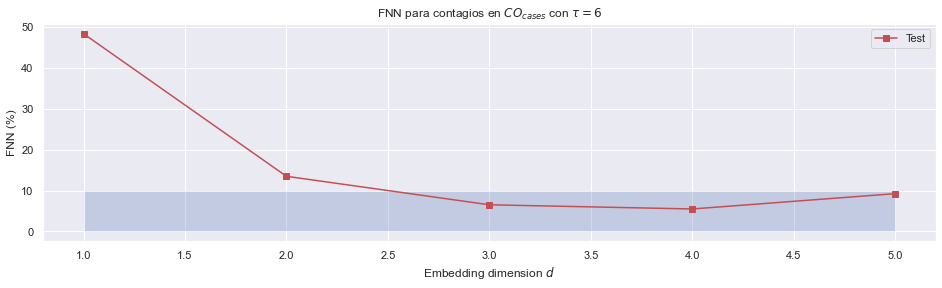

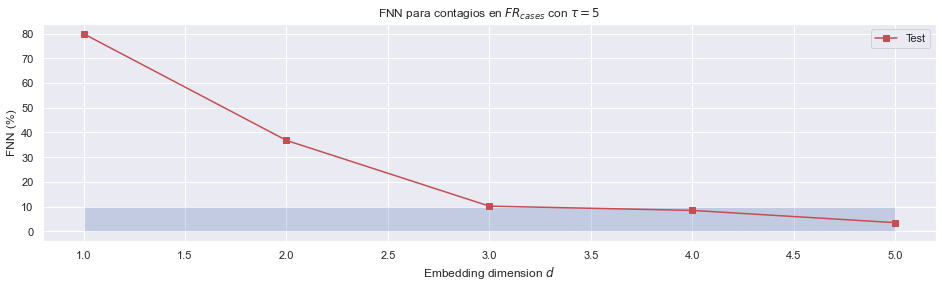

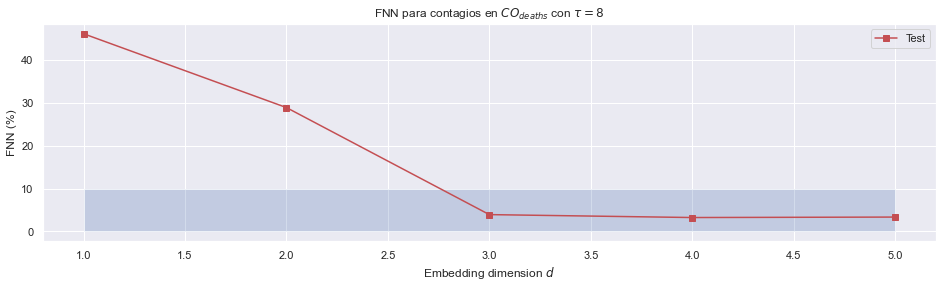

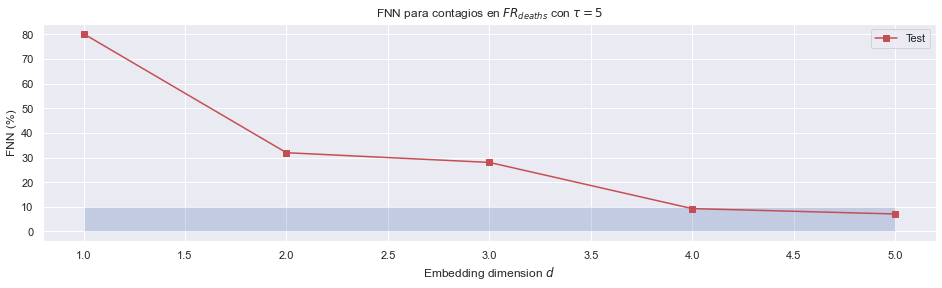

In [89]:
dim = np.arange(1, 6)
f1, f2, f3 = dimension.fnn(CO_cases, tau=6, dim=dim, window=10, maxnum=100) #, metric='chebyshev')

plt.figure(4, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $CO_{cases}$ con $\\tau=6$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(FR_cases, tau=5, dim=dim, window=10, maxnum=100) #, metric='chebyshev')

plt.figure(4, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $FR_{cases}$ con $\\tau=5$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(CO_deaths, tau=8, dim=dim, window=14, maxnum=100) #, metric='chebyshev')

plt.figure(5, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $CO_{deaths}$ con $\\tau=8$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

f1, f2, f3 = dimension.fnn(FR_deaths, tau=5, dim=dim, window=13, maxnum=100) #, metric='chebyshev')

plt.figure(5, figsize=(16,4))
plt.clf()
plt.title('FNN para contagios en $FR_{deaths}$ con $\\tau=5$')
plt.xlabel('Embedding dimension $d$')
plt.ylabel('FNN (%)')
plt.plot(dim, 100 * f1, 'rs-', label=r'Test')
#plt.plot(dim, 100 * f2, 'g^--', label=r'Test II')
#plt.plot(dim, 100 * f3, 'rs-', label=r'Test I + II')
plt.fill_between(dim, 10, alpha=0.25)
plt.legend()
plt.show()

## Reconstruimo el Atractor

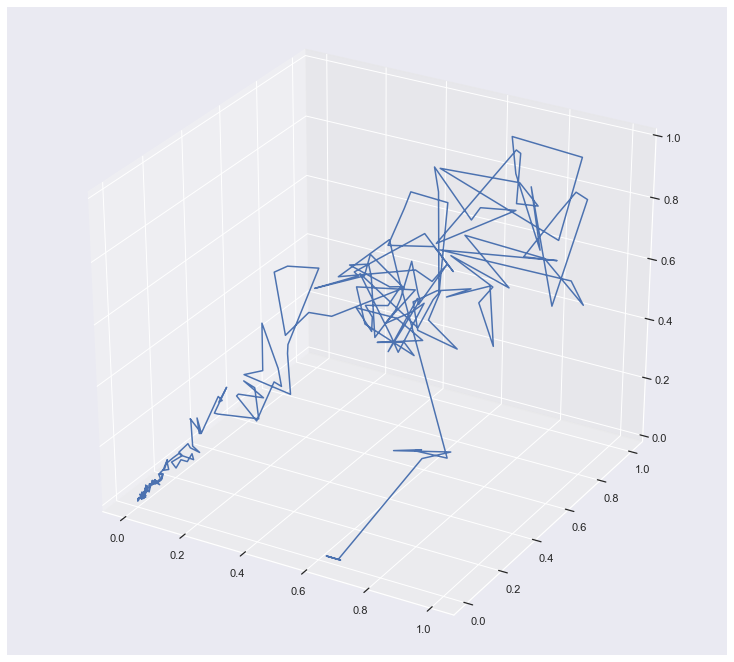

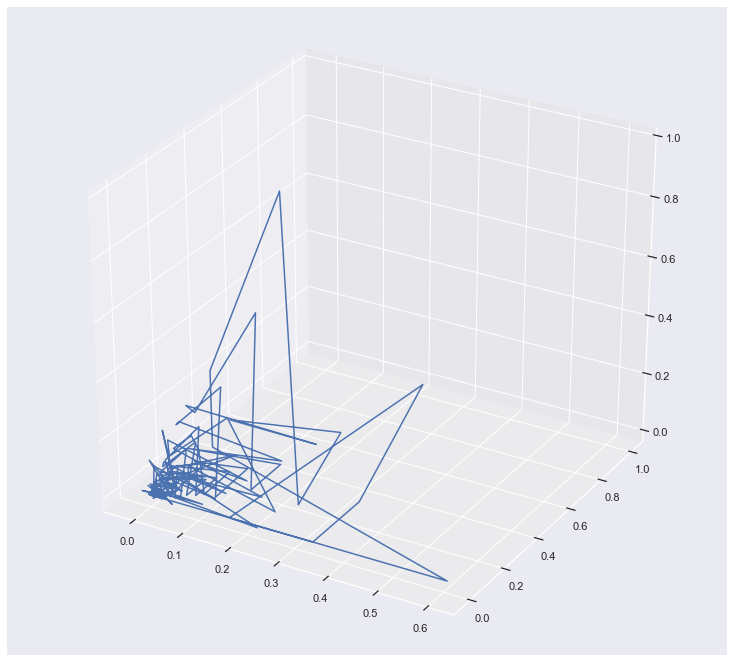

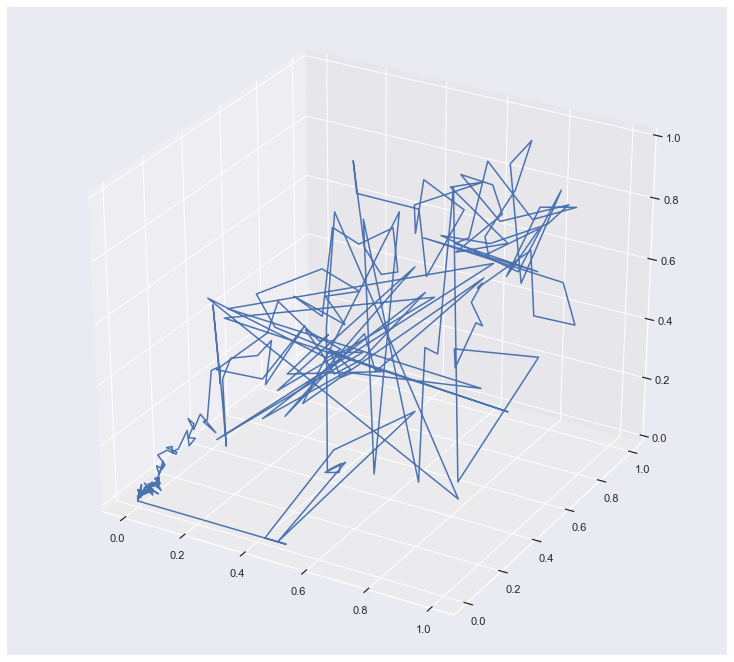

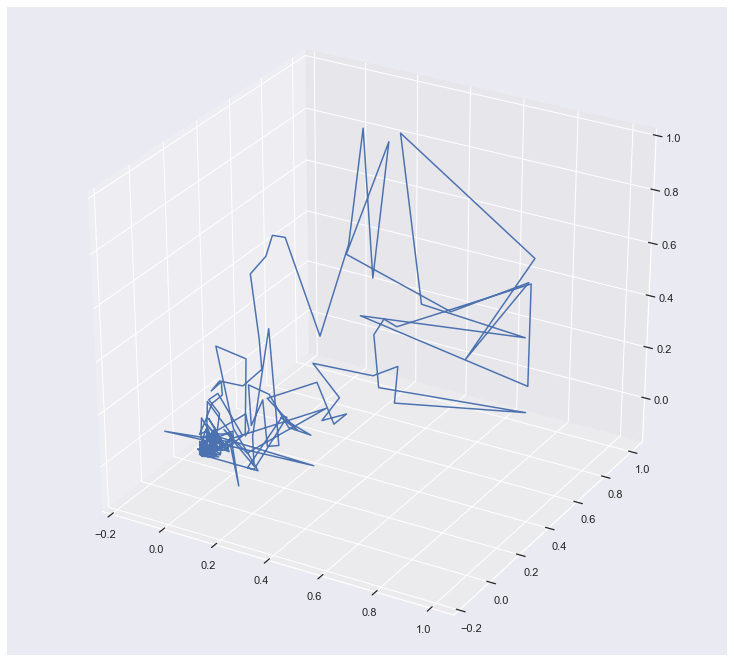

In [90]:
tau_CO_cases = 6

figg = plt.figure(6, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(CO_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(CO_cases), -tau_CO_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(CO_cases), -2 * tau_CO_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_FR_cases = 5

figg = plt.figure(6, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(FR_cases)[:-2].flatten()
data_lag1 = np.roll(np.array(FR_cases), -tau_FR_cases)[:-2].flatten()
data_lag2 = np.roll(np.array(FR_cases), -2 * tau_FR_cases)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_CO_deaths = 8

figg = plt.figure(7, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(CO_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(CO_deaths), -tau_CO_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(CO_deaths), -2 * tau_CO_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

tau_FR_deaths = 5

figg = plt.figure(7, figsize=(10, 9))
plt.clf()
axes = Axes3D(figg)
data_lag0 = np.array(FR_deaths)[:-2].flatten()
data_lag1 = np.roll(np.array(FR_deaths), -tau_FR_deaths)[:-2].flatten()
data_lag2 = np.roll(np.array(FR_deaths), -2 * tau_FR_deaths)[:-2].flatten()
axes.plot3D(data_lag0, data_lag1, data_lag2)
figg.add_axes(axes)
plt.show()

# ORDEN:
# - CO_cases
# - FR_cases
# - CO_deaths
# - FR_deaths

### Calculemos el Maximo Coeficiente del Exponente de Lyapunov (MCLE) mediante $\texttt{tseriesChaos}$

- series: time series.
- m: embedding dimension.
- d: time delay.
- t: Theiler window. Points separated by less than t in the series series are excluded from the search for neighbouring points.
- k: number of neighbours considered.
- ref: number of points in series taken into account.
- s: iterations along which the neighbours of each point are followed.
- eps: radius of the ball inside which nearest neighbours are searched for.

In [92]:
S_nu_CO_FR = pd.read_csv(r'C:\Users\ignac\OneDrive - Universidad de Chile\Escritorio\Practica-II-Covid-1\Presentacion\S_nu_CO_FR.csv')
S_nu_CO_FR.head()

,S_nu_CO_cases,S_nu_FR_cases,S_nu_CO_deaths,S_nu_FR_deaths
0,-inf,-inf,-inf,-inf
1,-inf,-4.253894,-inf,-inf
2,-inf,-inf,-inf,-inf
3,-inf,-4.160918,-inf,-inf
4,-inf,-4.114183,-inf,-inf


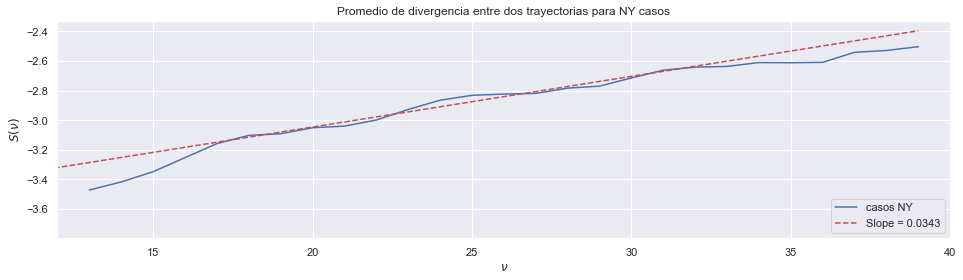

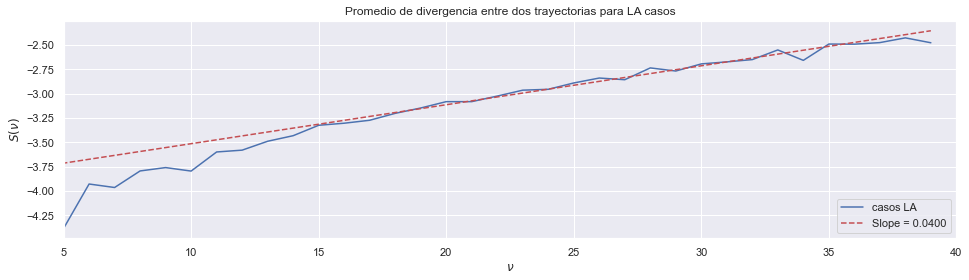

In [96]:
S_nu_CO_cases = S_nu_CO_FR['S_nu_CO_cases']
S_nu_FR_cases = S_nu_CO_FR['S_nu_FR_cases']
S_nu_CO_deaths = S_nu_CO_FR['S_nu_CO_deaths']
S_nu_FR_deaths = S_nu_CO_FR['S_nu_FR_deaths']

nu = np.arange(len(S_nu_CO_cases))

MCLE_CO_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[17:32], S_nu_CO_cases[17:32])

plt.figure(8, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_CO_cases, label='casos NY')
plt.plot(nu, MCLE_CO_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_CO_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para NY casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.xlim(12, 40)
plt.show()

nu = np.arange(len(S_nu_FR_cases))

MCLE_FR_cases, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[15:35], S_nu_FR_cases[15:35])

plt.figure(9, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_FR_cases, label='casos LA')
plt.plot(nu, MCLE_FR_cases*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_FR_cases), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para LA casos')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.xlim(5, 40)
plt.legend(loc=4)
plt.show()



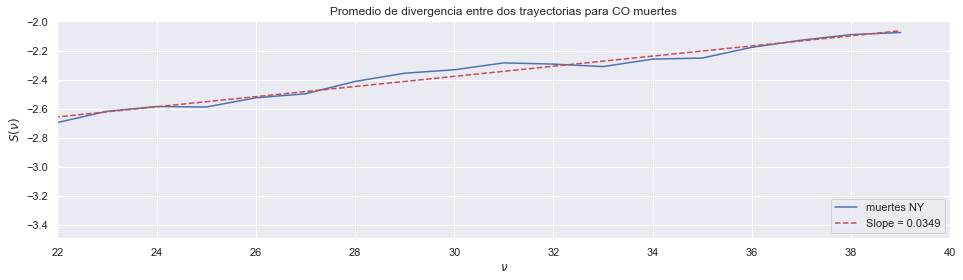

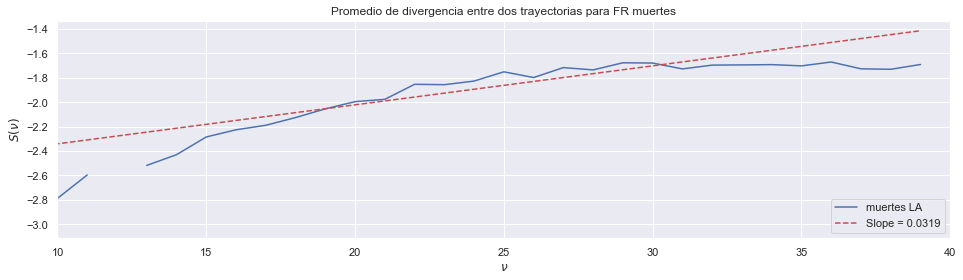

In [99]:
nu = np.arange(len(S_nu_CO_deaths))

MCLE_CO_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[22:37], S_nu_CO_deaths[22:37])

plt.figure(8, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_CO_deaths, label='muertes NY')
plt.plot(nu, MCLE_CO_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_CO_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para CO muertes')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.legend(loc=4)
plt.xlim(22, 40)
plt.show()

nu = np.arange(len(S_nu_FR_deaths))

MCLE_FR_deaths, intercept, r_value, p_value, std_err = sp.stats.linregress(nu[15:35], S_nu_FR_deaths[15:35])

plt.figure(9, figsize=(16,4))
plt.clf()
plt.plot(nu, S_nu_FR_deaths, label='muertes LA')
plt.plot(nu, MCLE_FR_deaths*nu + intercept, linestyle='--', label='Slope = {:.4f}'.format(MCLE_FR_deaths), color='r')
plt.title('Promedio de divergencia entre dos trayectorias para FR muertes')
plt.ylabel('$S(\\nu)$')
plt.xlabel('$\\nu$')
plt.xlim(10, 40)
plt.legend(loc=4)
plt.show()


In [101]:
data = {'': ['CO casos', 'FR casos', 'CO muertes', 'FR muertes'], 'MCLE': 365*np.round([MCLE_CO_cases, MCLE_FR_cases, MCLE_CO_deaths, MCLE_FR_deaths], 4),'delay': [6, 5, 8, 5]}
NN = pd.DataFrame(data)
NN

,,MCLE,delay
0,CO casos,12.5195,6
1,FR casos,14.6000,5
2,CO muertes,12.7385,8
3,FR muertes,11.6435,5


In [102]:
data = {'': ['NY casos', 'LA casos', 'NY muertes', 'LA muertes'], 'MCLE': 365*np.round([MCLE_NY_cases, MCLE_LA_cases, MCLE_NY_deaths, MCLE_LA_deaths], 4),'delay': [4, 5, 9, 10]}
NN = pd.DataFrame(data)
NN

,,MCLE,delay
0,NY casos,4.4895,4
1,LA casos,13.4685,5
2,NY muertes,-5.9495,9
3,LA muertes,8.3585,10
